In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [219]:
df=pd.read_csv('country_wise_latest.csv')
df.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [220]:
df.shape

(187, 15)

In [221]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 15 columns):
Country/Region            187 non-null object
Confirmed                 187 non-null int64
Deaths                    187 non-null int64
Recovered                 187 non-null int64
Active                    187 non-null int64
New cases                 187 non-null int64
New deaths                187 non-null int64
New recovered             187 non-null int64
Deaths / 100 Cases        187 non-null float64
Recovered / 100 Cases     187 non-null float64
Deaths / 100 Recovered    187 non-null float64
Confirmed last week       187 non-null int64
1 week change             187 non-null int64
1 week % increase         187 non-null float64
WHO Region                187 non-null object
dtypes: float64(4), int64(9), object(2)
memory usage: 22.0+ KB


In [222]:
df=df.rename(columns={'Country/Region':'Country'})

In [223]:
df.head()

,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [224]:
df.dtypes

Country                    object
Confirmed                   int64
Deaths                      int64
Recovered                   int64
Active                      int64
New cases                   int64
New deaths                  int64
New recovered               int64
Deaths / 100 Cases        float64
Recovered / 100 Cases     float64
Deaths / 100 Recovered    float64
Confirmed last week         int64
1 week change               int64
1 week % increase         float64
WHO Region                 object
dtype: object

### Editing columns and augmenting them

In [225]:
df.head()

,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [226]:
df['Deaths']=df['Deaths']+df['New deaths']

In [227]:
df['Recovered']=df['Recovered']+df['New recovered']

In [228]:
df['Confirmed']=df['Confirmed']+df['New cases']

In [229]:
df=df.drop(['New cases','New deaths','New recovered'], axis=1)

In [230]:
df.head()

,Country,Confirmed,Deaths,Recovered,Active,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36369,1279,25216,9796,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4997,150,2808,1991,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,28589,1171,19586,7973,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,917,52,803,52,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,968,42,242,667,4.32,25.47,16.94,749,201,26.84,Africa


In [231]:
df2=df.groupby('WHO Region').sum()
df2.head()

,Confirmed,Deaths,Recovered,Active,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
WHO Region,,,,,,,,,,
Africa,735383,12576,455208,270339,110.71,2736.71,inf,608120,115087,868.15
Americas,8968817,346287,4563392,4027938,106.84,2180.20,inf,7815198,1024088,571.59
Eastern Mediterranean,1503154,38784,1216243,251005,78.39,1465.05,inf,1398847,91897,230.61
Europe,3321817,211448,2005455,1094656,235.11,3843.56,inf,3146816,152707,435.10
South-East Asia,1884290,42083,1194515,637015,12.96,667.04,19.56,1478283,357014,85.13


In [232]:
df2.isna().any()

Confirmed                 False
Deaths                    False
Recovered                 False
Active                    False
Deaths / 100 Cases        False
Recovered / 100 Cases     False
Deaths / 100 Recovered    False
Confirmed last week       False
1 week change             False
1 week % increase         False
dtype: bool

In [233]:
df2.head()

,Confirmed,Deaths,Recovered,Active,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
WHO Region,,,,,,,,,,
Africa,735383,12576,455208,270339,110.71,2736.71,inf,608120,115087,868.15
Americas,8968817,346287,4563392,4027938,106.84,2180.20,inf,7815198,1024088,571.59
Eastern Mediterranean,1503154,38784,1216243,251005,78.39,1465.05,inf,1398847,91897,230.61
Europe,3321817,211448,2005455,1094656,235.11,3843.56,inf,3146816,152707,435.10
South-East Asia,1884290,42083,1194515,637015,12.96,667.04,19.56,1478283,357014,85.13


### Plot graph of by region

In [234]:
df2
df4=df2.loc[:,'Confirmed':'Active'].head()

In [235]:
df3=df.groupby('WHO Region')
df3.head()

,Country,Confirmed,Deaths,Recovered,Active,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36369,1279,25216,9796,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4997,150,2808,1991,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,28589,1171,19586,7973,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,917,52,803,52,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,968,42,242,667,4.32,25.47,16.94,749,201,26.84,Africa
5,Antigua and Barbuda,90,3,70,18,3.49,75.58,4.62,76,10,13.16,Americas
6,Argentina,172306,3179,74632,91782,1.83,43.35,4.21,130774,36642,28.02,Americas
7,Armenia,37463,717,26852,10014,1.90,71.32,2.67,34981,2409,6.89,Europe
8,Australia,15671,173,9448,5825,1.09,60.84,1.79,12428,2875,23.13,Western Pacific
9,Austria,20644,714,18283,1599,3.47,88.75,3.91,19743,815,4.13,Europe


In [236]:
deaths=df2['Deaths']
recovered=df2['Recovered']
confirmed=df2['Confirmed']
active=df2['Active']


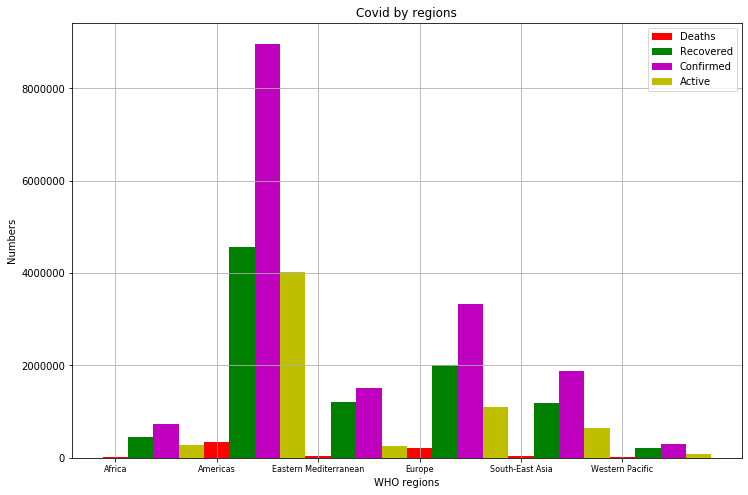

In [237]:
region=[region for region, df in  df3]
N=6
fig, axes=plt.subplots(figsize=(12,8))
w=0.
ind=np.arange(N)
axes.bar(ind+0.00, deaths, width=0.25,color='r',align='center', label='Deaths')
axes.bar(ind+0.25, recovered, width=0.25,color='g',align='center', label='Recovered')
axes.bar(ind+0.50, confirmed, width=0.25,color='m', align='center', label='Confirmed')
axes.bar(ind+0.75, active, width=0.25,color='y',align='center', label='Active')

axes.set_xticklabels(region,size=8)
axes.set_xticks(ind + w / 2)
axes.set_title('Covid by regions')
axes.set_ylabel('Numbers')
axes.set_xlabel('WHO regions')
axes.legend()
axes.grid()
axes.autoscale_view()
fig.savefig('WHO covid regions.png')

In [107]:
plt.bar?

Confirmed    int64
Deaths       int64
Recovered    int64
Active       int64
dtype: object

In [141]:
df5=df.loc[:,'Country':'Active']
df5.head()

,Country,Confirmed,Deaths,Recovered,Active
0,Afghanistan,36369,1279,25216,9796
1,Albania,4997,150,2808,1991
2,Algeria,28589,1171,19586,7973
3,Andorra,917,52,803,52
4,Angola,968,42,242,667


In [152]:
df5=df.groupby('Country')[['Confirmed','Deaths','Recovered','Active']].sum().reset_index()

In [153]:

df5.head()

,Country,Confirmed,Deaths,Recovered,Active
0,Afghanistan,36369,1279,25216,9796
1,Albania,4997,150,2808,1991
2,Algeria,28589,1171,19586,7973
3,Andorra,917,52,803,52
4,Angola,968,42,242,667


In [145]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 5 columns):
Country      187 non-null object
Confirmed    187 non-null int64
Deaths       187 non-null int64
Recovered    187 non-null int64
Active       187 non-null int64
dtypes: int64(4), object(1)
memory usage: 7.4+ KB


### Covid by countries

In [146]:
h=df5['Country'].unique()

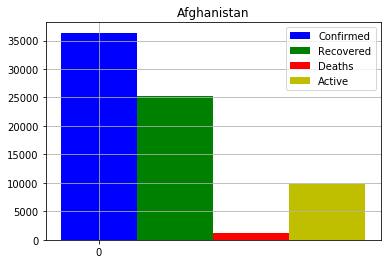

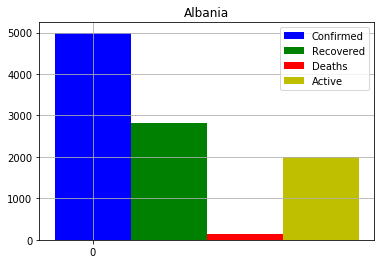

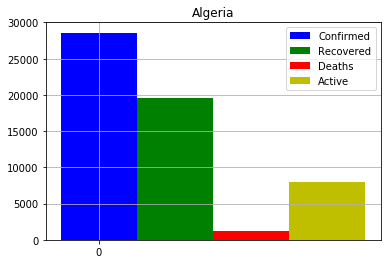

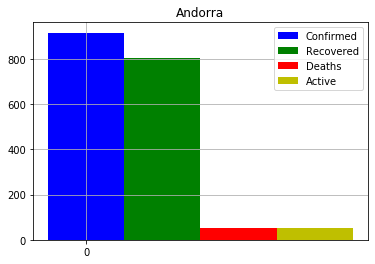

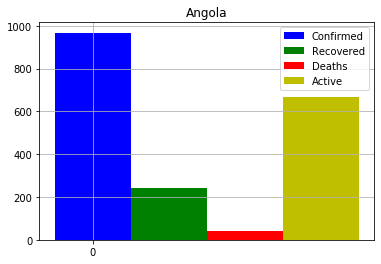

...

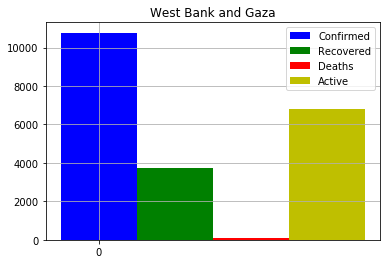

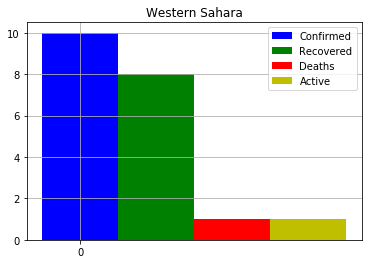

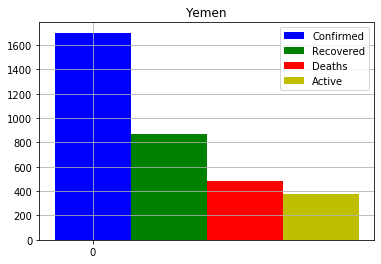

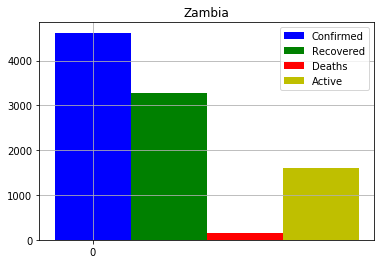

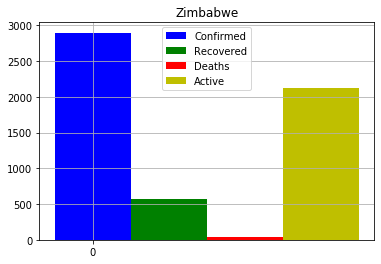

In [162]:
N=1
ind=np.arange(N)
w=0.25

for idx in range(0,len(h)):
    C=df5[df5['Country']==h[idx]].reset_index()
    plt.bar(ind+0.00,C['Confirmed'],width=0.25, color='b', align='center', label='Confirmed')
    plt.bar(ind+0.25,C['Recovered'], width=w,color='g',align='center',label='Recovered')
    plt.bar(ind+.50,C['Deaths'], width=w,color='r',align='center',label='Deaths')
    plt.bar(ind+.75,C['Active'], width=w,color='y',align='center',label='Active')
    plt.title(h[idx])
    plt.ylabel=("Totals")
    plt.xlabel=("Parameters")
    plt.xticks(ind)
    plt.legend()
    plt.grid()
   
    plt.show()
  

In [168]:
df[df["Deaths"]>10000]

,Country,Confirmed,Deaths,Recovered,Active,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
23,Brazil,2465659,88232,1880369,508116,3.59,75.61,4.74,2118646,323729,15.28,Americas
61,France,222903,30229,81479,108928,13.71,36.86,37.20,214023,6329,2.96,Europe
79,India,1524530,34045,984764,495499,2.26,64.26,3.51,1155338,324735,28.11,South-East Asia
81,Iran,296040,16124,257075,22550,5.42,86.90,6.24,276202,17404,6.30,Eastern Mediterranean
85,Italy,246454,35117,198740,12581,14.26,80.64,17.68,244624,1662,0.68,Europe
111,Mexico,400462,44364,312398,47657,11.13,76.82,14.49,349396,46093,13.19,Americas
132,Peru,403473,18993,277244,98752,4.73,69.93,6.76,357681,32036,8.96,Americas
138,Russia,822287,13419,605326,201097,1.63,73.74,2.21,776212,40468,5.21,Europe
157,Spain,272421,28432,150376,93613,10.44,55.20,18.91,264836,7585,2.86,Europe
173,US,4346595,149087,1353745,2816444,3.45,30.90,11.16,3834677,455582,11.88,Americas


In [183]:
df[df['Recovered']==df['Recovered'].min()]

,Country,Confirmed,Deaths,Recovered,Active,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
32,Canada,117140,8955,0,107514,7.68,0.0,inf,112925,3533,3.13,Americas
117,Mozambique,1733,11,0,1690,0.65,0.0,inf,1507,194,12.87,Africa
147,Serbia,24552,552,0,23598,2.25,0.0,inf,21253,2888,13.59,Europe
161,Sweden,79793,5703,0,73695,7.18,0.0,inf,78048,1347,1.73,Europe
163,Syria,698,42,0,634,5.93,0.0,inf,522,152,29.12,Eastern Mediterranean
168,Timor-Leste,24,0,0,24,0.00,0.0,0.0,24,0,0.00,South-East Asia


In [238]:
data=pd.read_csv('day_wise.csv',index_col=0,parse_dates=True)
data.head()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
Date,,,,,,,,,,,
2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8
2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9
2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11
2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13


In [239]:
data['Confirmed']=data['New cases']+data['Confirmed']
data['Recovered']=data['New recovered']+data['Recovered']
data['Active']=data['New cases']+data['Active']
data['Deaths']=data['Deaths']+data['New deaths']

In [240]:
data.head()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
Date,,,,,,,,,,,
2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
2020-01-23,753,19,32,705,99,1,2,2.75,4.59,60.00,8
2020-01-24,1228,34,42,1166,287,8,6,2.76,3.83,72.22,9
2020-01-25,1927,58,42,1846,493,16,3,2.93,2.72,107.69,11
2020-01-26,2802,70,65,2694,684,14,13,2.64,2.46,107.69,13


In [241]:
data=data.drop(['Deaths / 100 Cases','Recovered / 100 Cases','Deaths / 100 Recovered'],axis=1)

In [242]:
data.head()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,No. of countries
Date,,,,,,,,
2020-01-22,555,17,28,510,0,0,0,6
2020-01-23,753,19,32,705,99,1,2,8
2020-01-24,1228,34,42,1166,287,8,6,9
2020-01-25,1927,58,42,1846,493,16,3,11
2020-01-26,2802,70,65,2694,684,14,13,13


In [243]:
data.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,No. of countries
count,1.880000e+02,188.000000,1.880000e+02,1.880000e+02,188.000000,188.000000,188.000000,188.000000
mean,4.494731e+06,234249.585106,2.116363e+06,2.197959e+06,87771.021277,3478.824468,50362.015957,144.351064
std,4.830427e+06,219525.470577,2.680537e+06,2.042613e+06,75295.293255,2537.735652,56090.892479,65.175979
min,5.550000e+02,17.000000,2.800000e+01,5.100000e+02,0.000000,0.000000,0.000000,6.000000
25%,1.161045e+05,4134.000000,6.237350e+04,6.308225e+04,5568.500000,250.750000,2488.250000,101.250000
50%,2.939686e+06,210316.000000,8.230590e+05,1.950712e+06,81114.000000,4116.000000,30991.500000,184.000000
75%,7.557093e+06,423731.750000,3.496162e+06,3.722062e+06,131502.500000,5346.000000,79706.250000,187.000000
max,1.670918e+07,659451.000000,9.642710e+06,6.587055e+06,282756.000000,9966.000000,284394.000000,187.000000


In [244]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 188 entries, 2020-01-22 to 2020-07-27
Data columns (total 8 columns):
Confirmed           188 non-null int64
Deaths              188 non-null int64
Recovered           188 non-null int64
Active              188 non-null int64
New cases           188 non-null int64
New deaths          188 non-null int64
New recovered       188 non-null int64
No. of countries    188 non-null int64
dtypes: int64(8)
memory usage: 13.2 KB


In [245]:
data=data.reset_index()

In [246]:
data.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,No. of countries
0,2020-01-22,555,17,28,510,0,0,0,6
1,2020-01-23,753,19,32,705,99,1,2,8
2,2020-01-24,1228,34,42,1166,287,8,6,9
3,2020-01-25,1927,58,42,1846,493,16,3,11
4,2020-01-26,2802,70,65,2694,684,14,13,13


In [247]:
data.dtypes

Date                datetime64[ns]
Confirmed                    int64
Deaths                       int64
Recovered                    int64
Active                       int64
New cases                    int64
New deaths                   int64
New recovered                int64
No. of countries             int64
dtype: object

In [248]:
dat=data.set_index('Date')

In [249]:
dat.head()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,No. of countries
Date,,,,,,,,
2020-01-22,555,17,28,510,0,0,0,6
2020-01-23,753,19,32,705,99,1,2,8
2020-01-24,1228,34,42,1166,287,8,6,9
2020-01-25,1927,58,42,1846,493,16,3,11
2020-01-26,2802,70,65,2694,684,14,13,13


In [250]:
df=data.groupby('Date')[['Confirmed','Deaths','Recovered','Active']].sum()

In [251]:
df.head()

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-01-22,555,17,28,510
2020-01-23,753,19,32,705
2020-01-24,1228,34,42,1166
2020-01-25,1927,58,42,1846
2020-01-26,2802,70,65,2694


# Plotting daywise

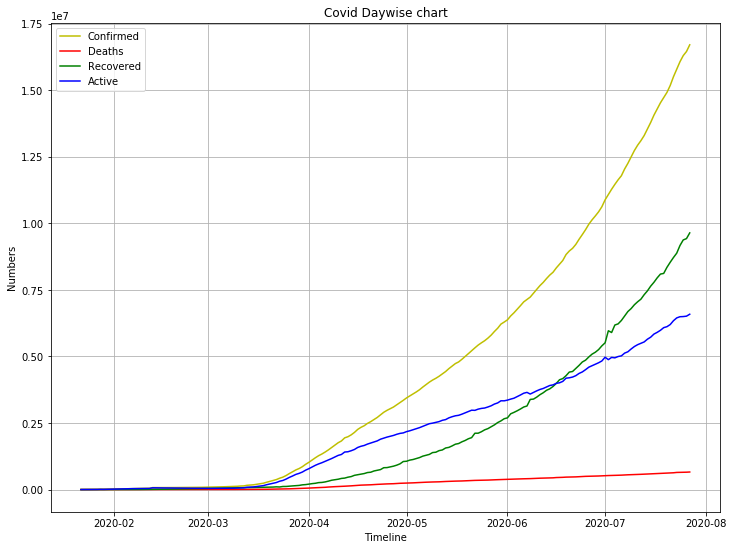

In [252]:
fig, axes=plt.subplots(figsize=(12,9))

axes.plot(df.index,df['Confirmed'],color='y',label="Confirmed")
axes.plot(df.index, df['Deaths'],color='r',label='Deaths')
axes.plot(df.index,df['Recovered'],color='g',label='Recovered')
axes.plot(df.index, df['Active'],color='b',label='Active')
axes.set_title("Covid Daywise chart")
axes.set_xlabel("Timeline")
axes.set_ylabel("Numbers")
axes.legend()
axes.grid()


### Add a monthly column

In [256]:
dat=dat.reset_index()

In [257]:
dat.dtypes

Date                datetime64[ns]
Confirmed                    int64
Deaths                       int64
Recovered                    int64
Active                       int64
New cases                    int64
New deaths                   int64
New recovered                int64
No. of countries             int64
dtype: object

In [258]:
dat.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,No. of countries
0,2020-01-22,555,17,28,510,0,0,0,6
1,2020-01-23,753,19,32,705,99,1,2,8
2,2020-01-24,1228,34,42,1166,287,8,6,9
3,2020-01-25,1927,58,42,1846,493,16,3,11
4,2020-01-26,2802,70,65,2694,684,14,13,13


In [272]:
dat["Month"]=dat['Date'].str[5:7].astype('int')
dat.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,No. of countries,Month
0,2020-01-22,555,17,28,510,0,0,0,6,1
1,2020-01-23,753,19,32,705,99,1,2,8,1
2,2020-01-24,1228,34,42,1166,287,8,6,9,1
3,2020-01-25,1927,58,42,1846,493,16,3,11,1
4,2020-01-26,2802,70,65,2694,684,14,13,13,1


In [268]:
# dat['Date']=dat['Date'].dt.strftime('%Y-%m-%d')

In [273]:
dat.tail()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,No. of countries,Month
183,2020-07-23,15793237,643472,8880683,6448762,282756,9966,169714,187,7
184,2020-07-24,16072809,645794,9168441,6493454,281164,6144,228736,187,7
185,2020-07-25,16302735,649384,9377781,6499475,255545,4867,219038,187,7
186,2020-07-26,16456402,652725,9428185,6514317,204606,4104,134721,187,7
187,2020-07-27,16709178,659451,9642710,6587055,228693,5415,174623,187,7


In [274]:
df=dat.groupby('Month')[['Date','Confirmed','Deaths','Recovered','Active']].sum()

In [276]:
df.tail()

,Confirmed,Deaths,Recovered,Active
Month,,,,
3,9788879,439143,2780132,6746906
4,65804045,4501440,16759562,45548811
5,147911441,9748506,54472811,85424999
6,250791588,13446657,119680138,120498267
7,368926759,15852493,203780852,153622868


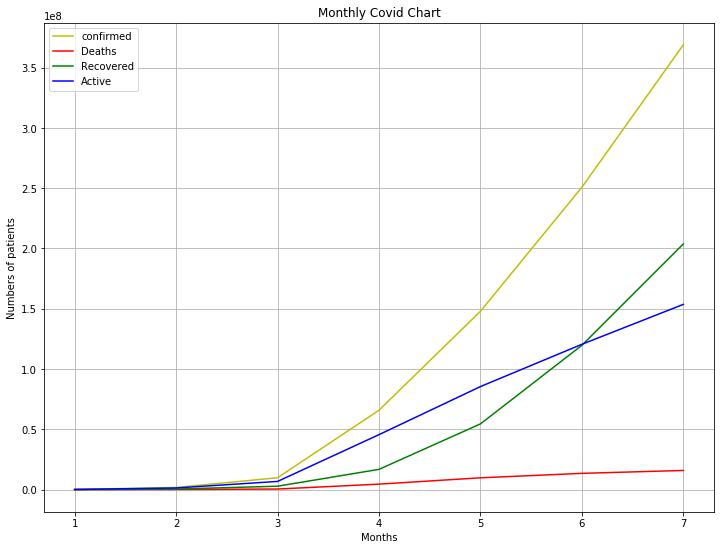

In [280]:
fig, axes=plt.subplots(figsize=(12,9))

axes.plot(df.index,df['Confirmed'],color='y',label='confirmed')
axes.plot(df.index,df['Deaths'],color='r',label='Deaths')
axes.plot(df.index, df['Recovered'],color='g',label='Recovered')
axes.plot(df.index, df['Active'],color='b',label='Active')
axes.set_title('Monthly Covid Chart')
axes.set_xlabel('Months')
axes.set_ylabel('Numbers of patients')
axes.legend()
axes.grid()
fig.savefig('Monthly covid.png')

## New group

In [134]:
df=pd.read_csv('full_grouped.csv')
df.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region
0,1/22/2020,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean
1,1/22/2020,Albania,0,0,0,0,0,0,0,Europe
2,1/22/2020,Algeria,0,0,0,0,0,0,0,Africa
3,1/22/2020,Andorra,0,0,0,0,0,0,0,Europe
4,1/22/2020,Angola,0,0,0,0,0,0,0,Africa


In [135]:
df=df.rename(columns={'Country/Region':'Country'})

In [136]:
df.dtypes

Date             object
Country          object
Confirmed         int64
Deaths            int64
Recovered         int64
Active            int64
New cases         int64
New deaths        int64
New recovered     int64
WHO Region       object
dtype: object

In [137]:
df['Month']=df['Date'].str[5:7].astype('int64')
df.head()

,Date,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,Month
0,1/22/2020,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,20
1,1/22/2020,Albania,0,0,0,0,0,0,0,Europe,20
2,1/22/2020,Algeria,0,0,0,0,0,0,0,Africa,20
3,1/22/2020,Andorra,0,0,0,0,0,0,0,Europe,20
4,1/22/2020,Angola,0,0,0,0,0,0,0,Africa,20


In [138]:
df.dtypes

Date             object
Country          object
Confirmed         int64
Deaths            int64
Recovered         int64
Active            int64
New cases         int64
New deaths        int64
New recovered     int64
WHO Region       object
Month             int64
dtype: object

In [139]:
df['Date']=pd.to_datetime(df['Date'])

In [140]:
df.dtypes

Date             datetime64[ns]
Country                  object
Confirmed                 int64
Deaths                    int64
Recovered                 int64
Active                    int64
New cases                 int64
New deaths                int64
New recovered             int64
WHO Region               object
Month                     int64
dtype: object

In [141]:
df.set_index('Date')

,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,Month
Date,,,,,,,,,,
2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,20
2020-01-22,Albania,0,0,0,0,0,0,0,Europe,20
2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,20
2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,20
2020-01-22,Angola,0,0,0,0,0,0,0,Africa,20
...,...,...,...,...,...,...,...,...,...,...
2020-07-27,West Bank and Gaza,10621,78,3752,6791,152,2,0,Eastern Mediterranean,20
2020-07-27,Western Sahara,10,1,8,1,0,0,0,Africa,20
2020-07-27,Yemen,1691,483,833,375,10,4,36,Eastern Mediterranean,20


In [142]:
df.head()

,Date,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,Month
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,20
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,20
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,20
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,20
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,20


In [143]:
df['Country']

0               Afghanistan
1                   Albania
2                   Algeria
3                   Andorra
4                    Angola
                ...        
35151    West Bank and Gaza
35152        Western Sahara
35153                 Yemen
35154                Zambia
35155              Zimbabwe
Name: Country, Length: 35156, dtype: object

In [144]:
df1=df.groupby('Country')
df1.head()

,Date,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,Month
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,20
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,20
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,20
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,20
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,20
...,...,...,...,...,...,...,...,...,...,...,...
930,2020-01-26,West Bank and Gaza,0,0,0,0,0,0,0,Eastern Mediterranean,20
931,2020-01-26,Western Sahara,0,0,0,0,0,0,0,Africa,20
932,2020-01-26,Yemen,0,0,0,0,0,0,0,Eastern Mediterranean,20
933,2020-01-26,Zambia,0,0,0,0,0,0,0,Africa,20


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


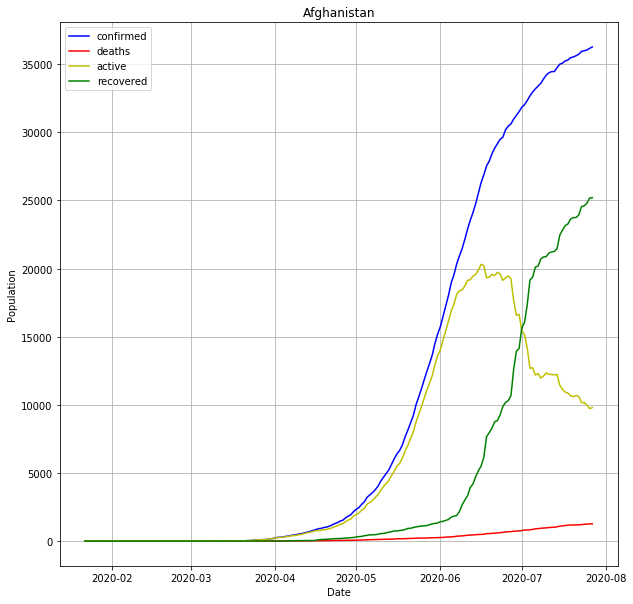

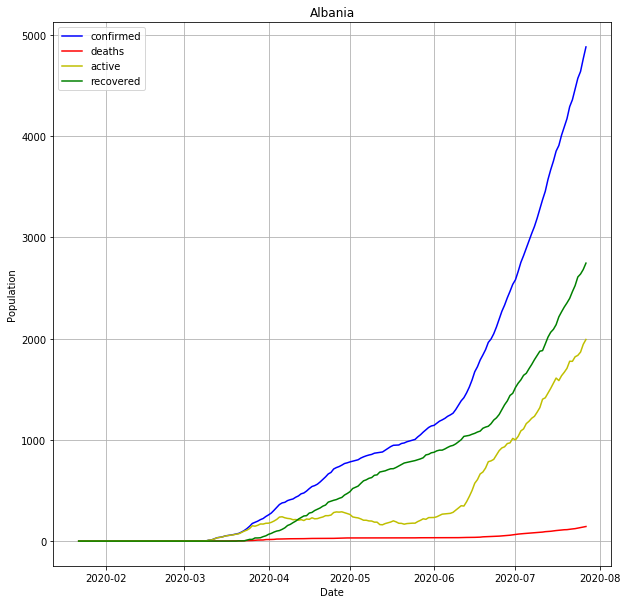

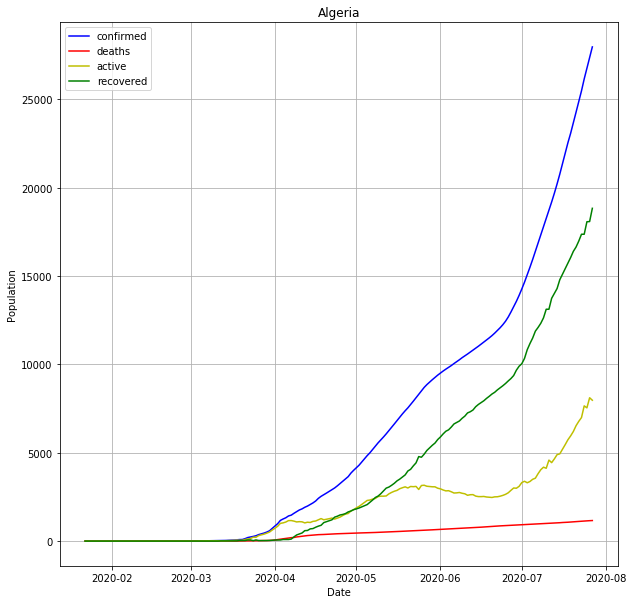

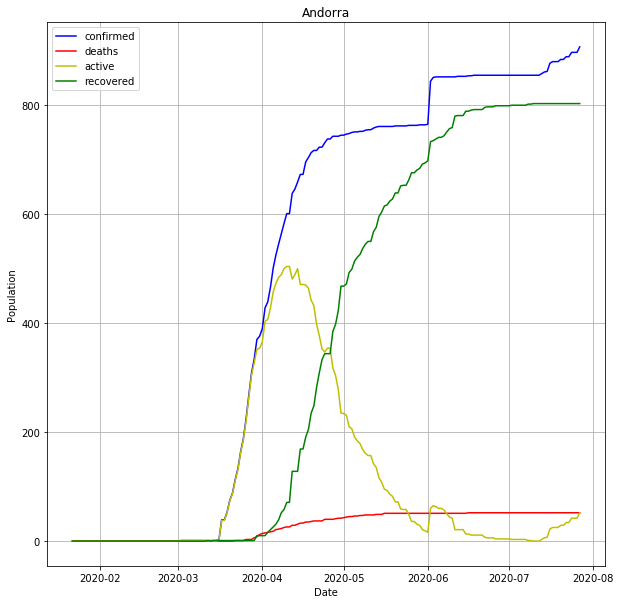

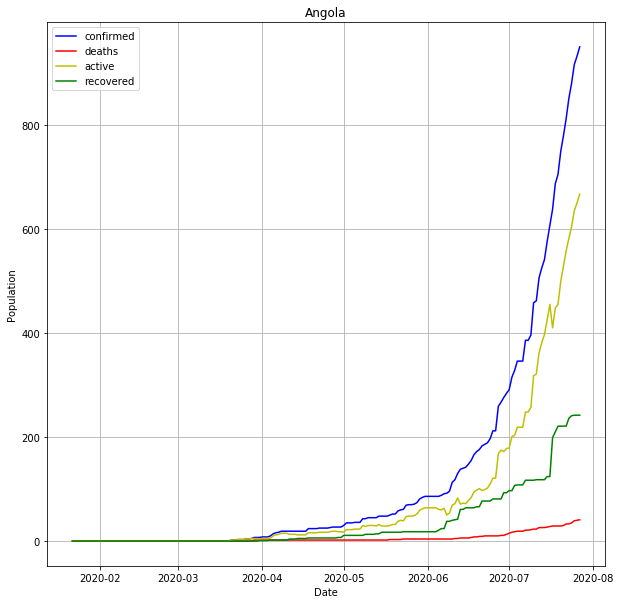

...

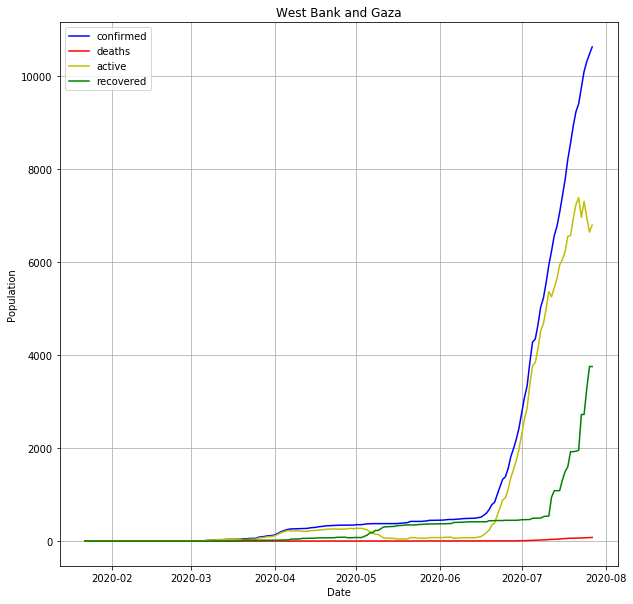

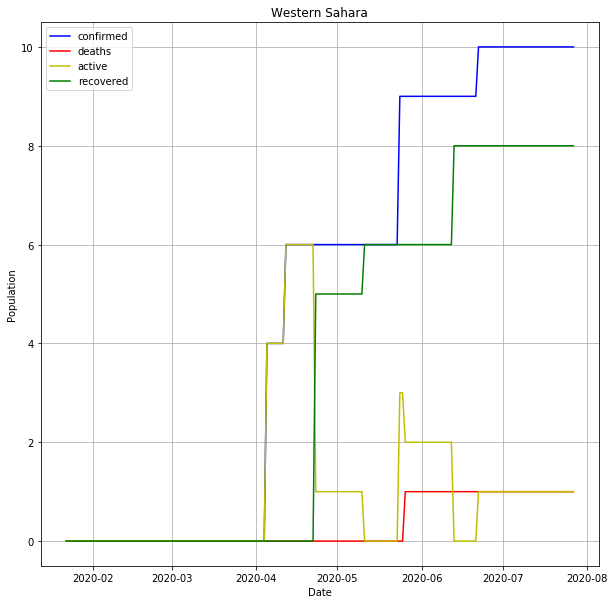

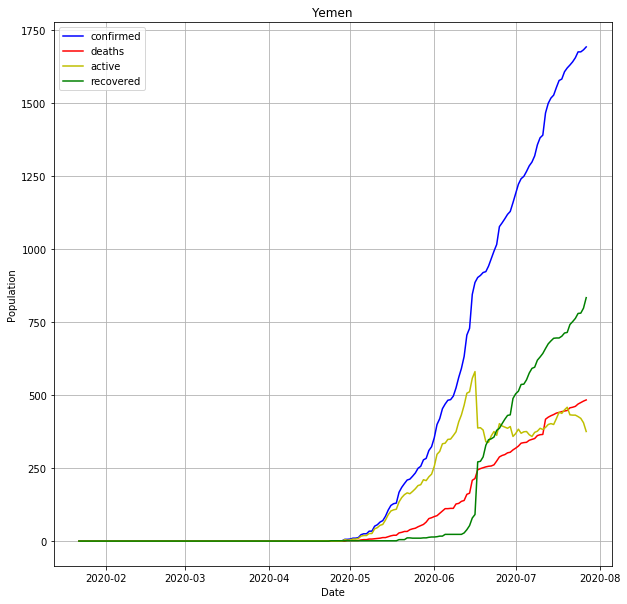

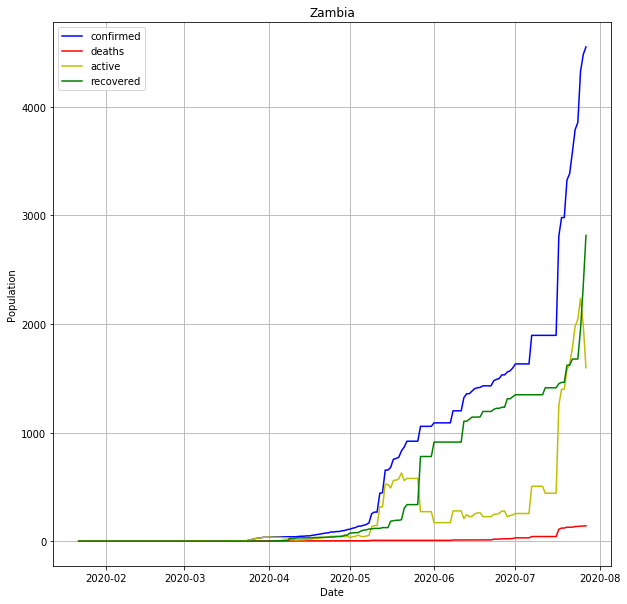

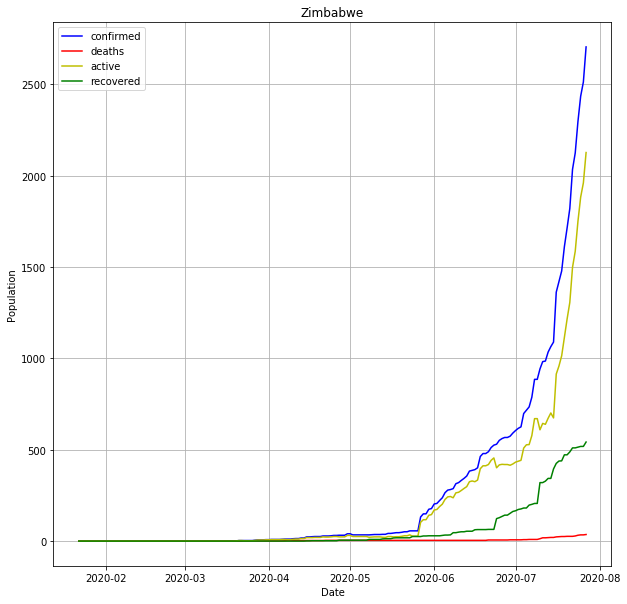

In [145]:

for name, Country in df1:
    fig, ax=plt.subplots(figsize=(10,10))
    Country
    ax.plot(Country['Date'],Country['Confirmed'],color='b',label='confirmed')
    ax.plot(Country['Date'],Country['Deaths'],color='r',label='deaths')
    ax.plot(Country['Date'],Country['Active'],color='y',label='active')
    ax.plot(Country['Date'],Country['Recovered'],color='g',label='recovered')
    ax.set_title(name)
    ax.grid()
    ax.set_xlabel('Date')
    ax.set_ylabel('Population')
    ax.legend()
    fig.savefig('./images/'+name)

In [146]:
df2=df.groupby(['Country','Date'])[['Confirmed','Deaths','Recovered','Active']].sum()

In [147]:
df2.head()

Confirmed  Deaths  Recovered  Active
Country     Date                                            
Afghanistan 2020-01-22          0       0          0       0
            2020-01-23          0       0          0       0
            2020-01-24          0       0          0       0
            2020-01-25          0       0          0       0
            2020-01-26          0       0          0       0

In [148]:
df2.index.names

FrozenList(['Country', 'Date'])

In [149]:
df_kenya=df2.loc['Kenya']

In [150]:
df2.loc[['United Kingdom','Brazil','France','Germany','US','South Korea']]
df_usa=df2.loc['US']
df_sk=df2.loc['South Korea']
df_uk=df2.loc['United Kingdom']
df_brazil=df2.loc['Brazil']
df_france=df2.loc['France']
df_germ=df2.loc['Germany']


In [151]:
countries=df['Country'].unique()

In [152]:
df_kenya.head()

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-01-22,0,0,0,0
2020-01-23,0,0,0,0
2020-01-24,0,0,0,0
2020-01-25,0,0,0,0
2020-01-26,0,0,0,0


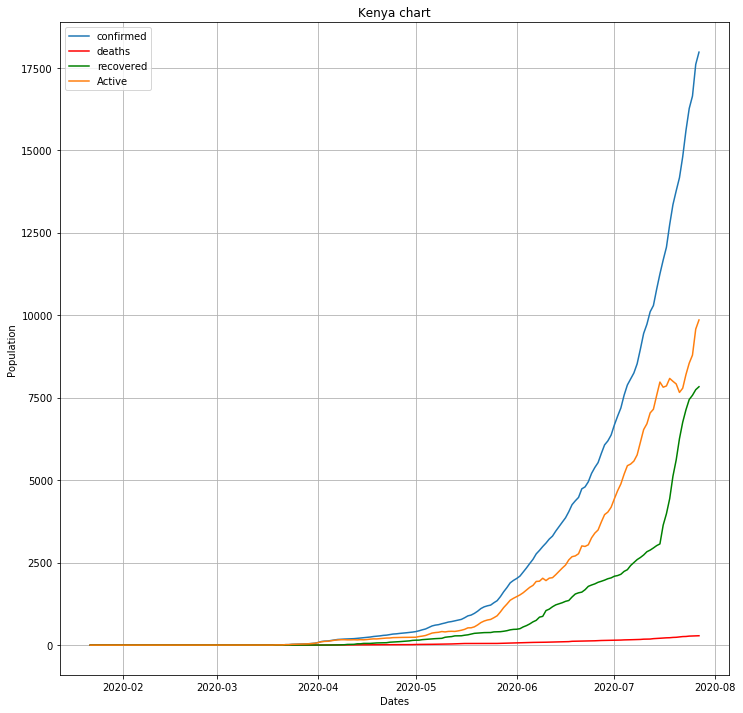

In [153]:
fig, axes=plt.subplots(figsize=(12,12))
axes.plot(df_kenya.index,df_kenya['Confirmed'],label='confirmed')
axes.plot(df_kenya.index,df_kenya['Deaths'],color='r',label='deaths')
axes.plot(df_kenya.index,df_kenya['Recovered'],color='g',label='recovered')
axes.plot(df_kenya.index,df_kenya['Active'],label='Active')
axes.set_xlabel('Dates')
axes.set_ylabel('Population')
axes.set_title('Kenya chart')
axes.grid()
axes.legend()

In [44]:
countries=df['Country'].unique()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


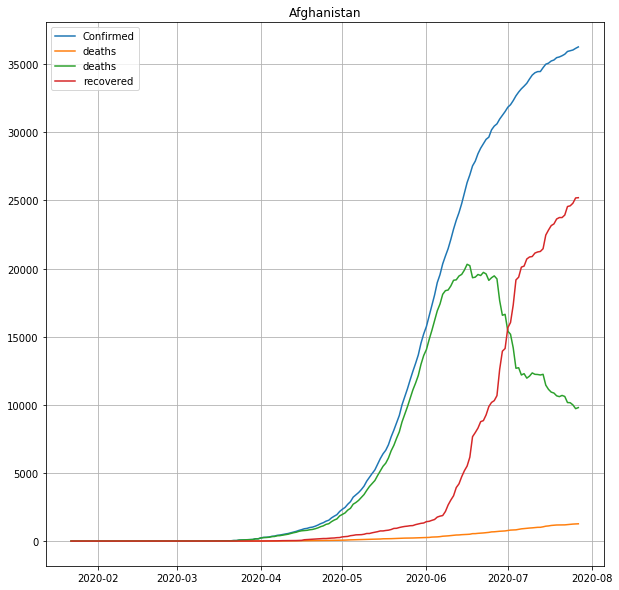

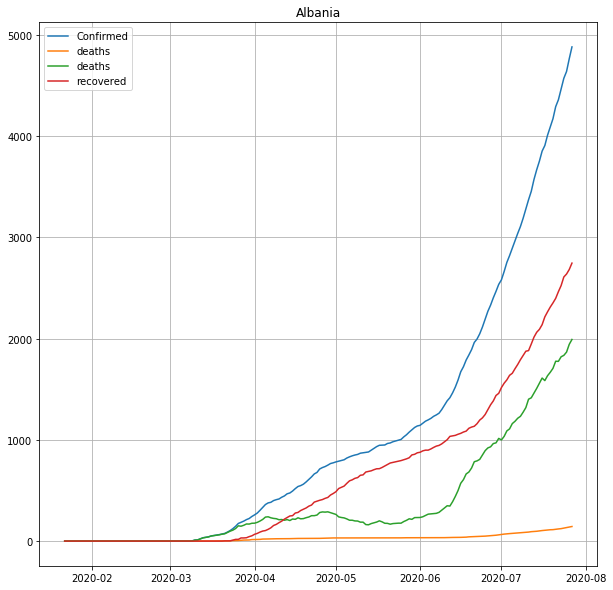

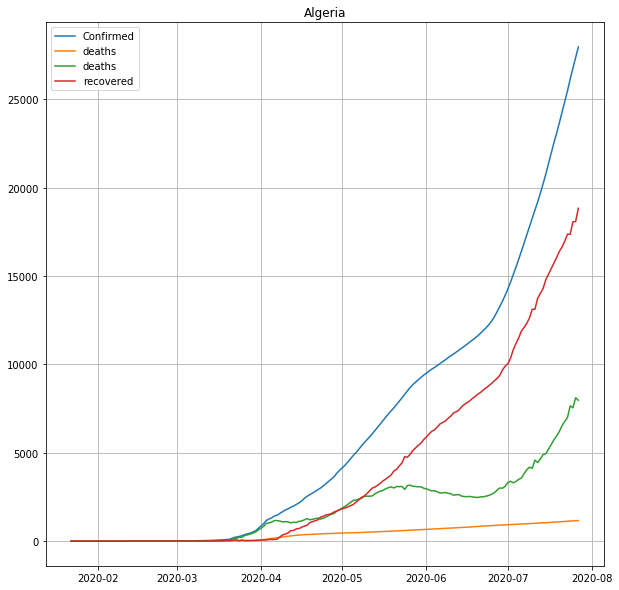

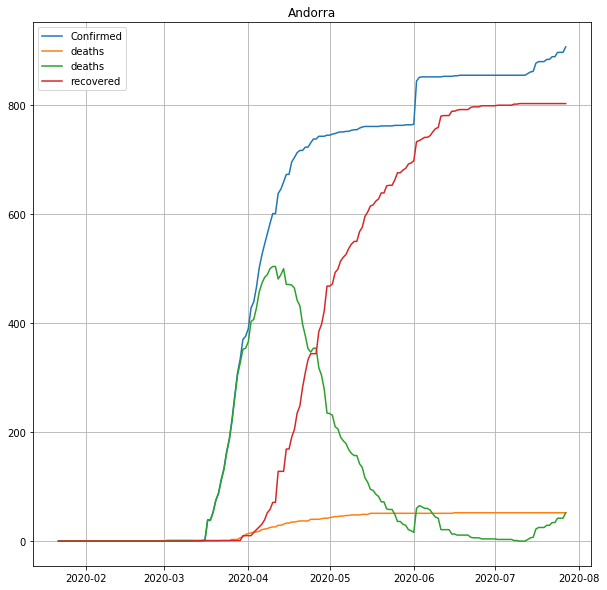

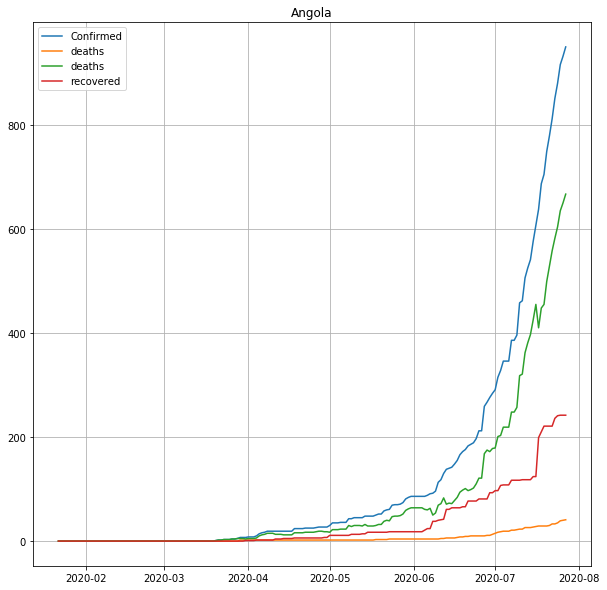

...

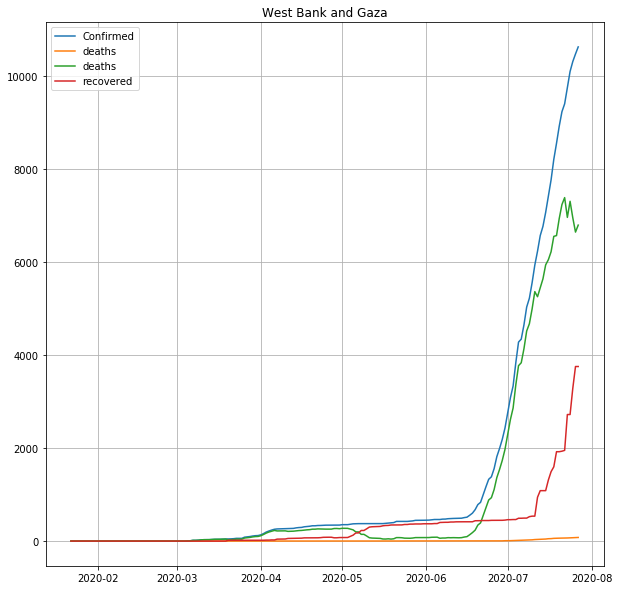

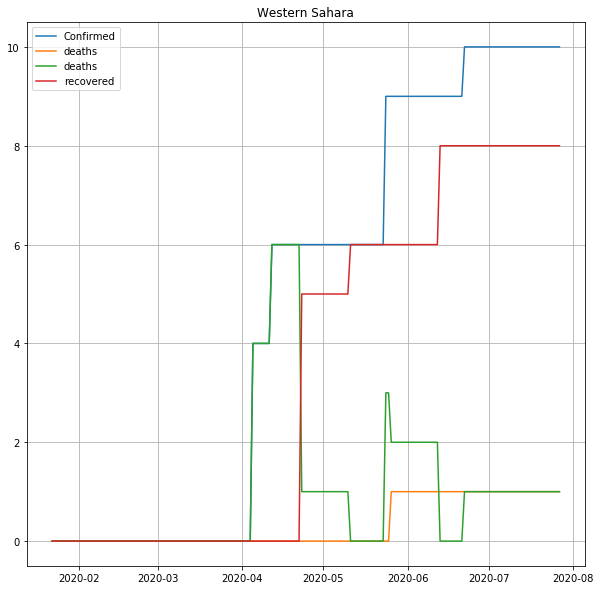

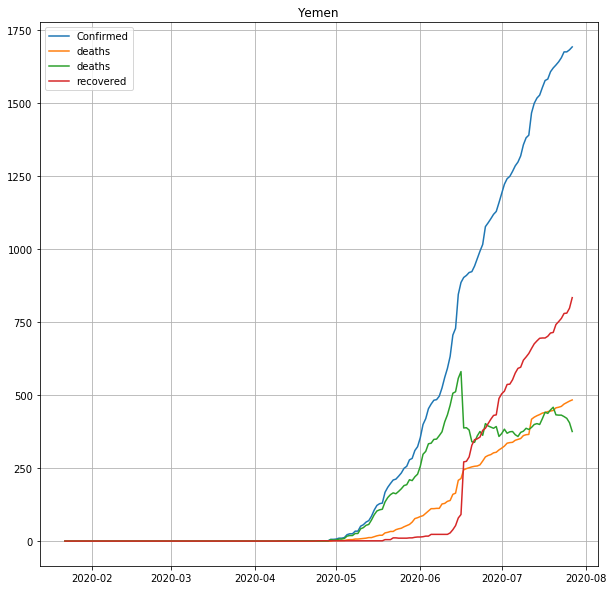

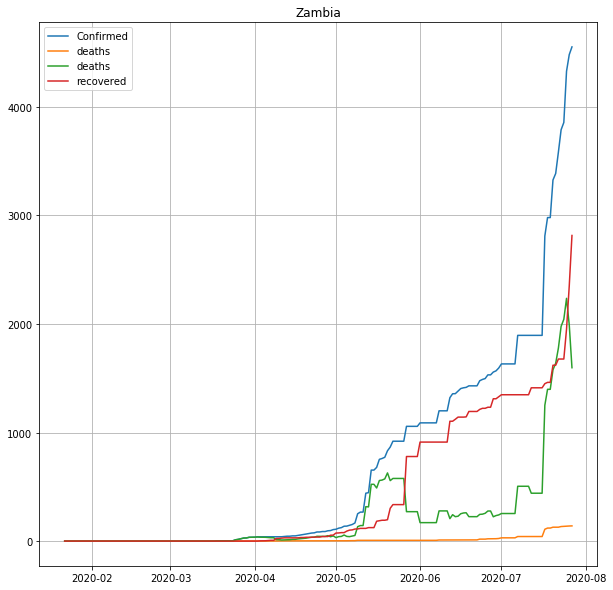

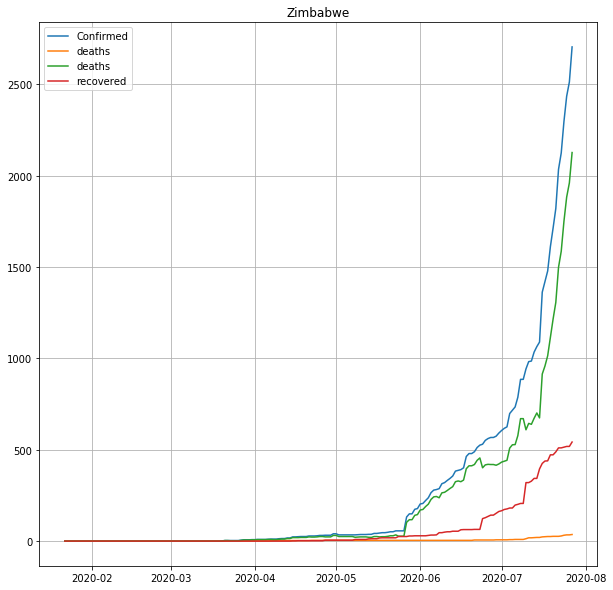

In [154]:

for i in range(0,len(countries)):
    fig,axes=plt.subplots(figsize=(10,10))
    C=df[df['Country']==countries[i]]
    axes.plot(C['Date'],C['Confirmed'],label='Confirmed')
    axes.plot(C['Date'],C['Deaths'],label='deaths')
    axes.plot(C['Date'],C['Active'],label='deaths')
    axes.plot(C['Date'],C['Recovered'],label='recovered')
    axes.set_title(countries[i])
    axes.grid()
    axes.legend()
    
    

In [120]:
"""Today was a success 
Found two ways of plotting multiIndex dataframes
first group by the specifi id you want to use to plot and equate the dataframe to a pd
loop through the df in twos i.e for name(name of the id), Country(the id) in df(the pd you equated the groupby to)
set title to name and use country to access the columns
secondly then loop through the len of ID's and equate the IDs to the respective column names
C=df[df['Country']==countries[idx]]

"""

"Today was a success \nFound two ways of plotting multiIndex dataframes\nfirst group by the specifi id you want to use to plot and equate the dataframe to a pd\nloop through the df in twos i.e for name(name of the id), Country(the id) in df(the pd you equated the groupby to)\nset title to name and use country to access the columns\nsecondly then loop through the len of ID's and equate the IDs to the respective column names\nC=df[df['Country']==countries[idx]]\n\n"

In [123]:
countries

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon',
       'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Greenland',
       'Grenada', 'Guatemala', 'Guinea', 'G

In [ ]:
df.loc['Taiwan*']